# Попиксельное преобразование изображений

В этом блокноте мы рассмотрим простой пример попиксельных изменений (преобразований) изображений.

Для начала установим необходимую версию библиотеки и подключим то, чем будем пользоваться в дальнейшем.

In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
%matplotlib inline
import matplotlib as mpl

Считаем исходное изображение и переведем его из цветового пространства BGR в привычное RGB. Представление картинки — тензор. В элементе <code>img_original[i][j]</code> содержится $3$ значения, равные интенсивностям пикселя $(i, j)$ относительно трех цветовых каналов; значения находятся в диапазоне $[0, 255] \cap \mathbb Z$.

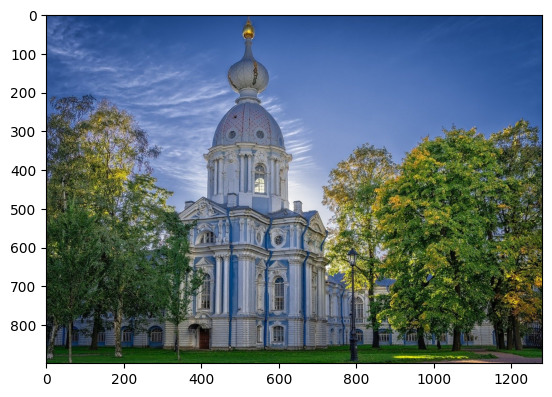

In [2]:
img_original = cv2.imread('1.jpeg')
img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)
plt.imshow(img_original)
plt.show()

Найдем ширину, высоту и среднее значение интенсивности пикселя исходного изображения:

In [3]:
print("высота:", img_original.shape[0], "ширина:", img_original.shape[1])
print("среднее значение интенсивности пикселя:", np.mean(img_original))

высота: 899 ширина: 1280
среднее значение интенсивности пикселя: 97.90389524239896


## Изменение экспозиции вручную

Применим к каждому пикселю преобразование, задаваемое следующим образом: $I(out) = I(in) \cdot 2^p$, где $p$ - некоторый параметр из $[-1,1]$. Пусть, скажем, $p = 0.8$.

In [7]:
def exposure(image, p):
    return image.copy() * (2 ** p)

img_result = exposure(img_original, -0.53)


Посмотрим на новое изображение

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


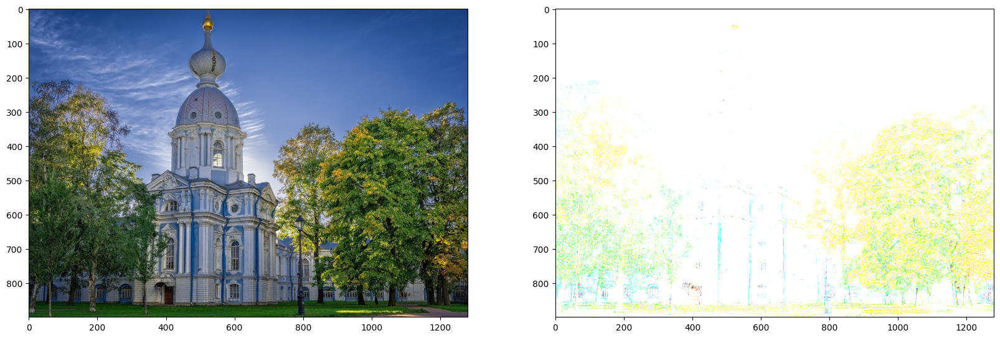

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(img_original)
axes[1].imshow(img_result)

Новое изображение нам не увидеть. Разберемся, в чем причина. Дело в том, что рассматриваемое преобразование, по своей сути, просто изменяет значение интенсивности каждого пикселя в $2^p$ раз. Очевидно, что, во-первых, могут быть получены значения большие, чем 255, во-вторых, значения скорее всего не будут целыми:

In [9]:
img_result[50][50]

array([ 38.78306511,  60.9448166 , 103.19065537])

Если мы попытаемся избавиться только от первой проблемы, то изображение мы получим, но совсем не то, которое хотели:

In [10]:
def exposure(image, p):
    img_result = image.copy()
    for i in range(0, img_result.shape[0]):
      for j in range(0, img_result.shape[1]):
        img_result[i,j] = (round(img_result[i,j][0]*2**p,0),round(img_result[i,j][1]*2**p,0),round(img_result[i,j][2]*2**p,0))
    return img_result

img_result = exposure(img_original, -0.53)

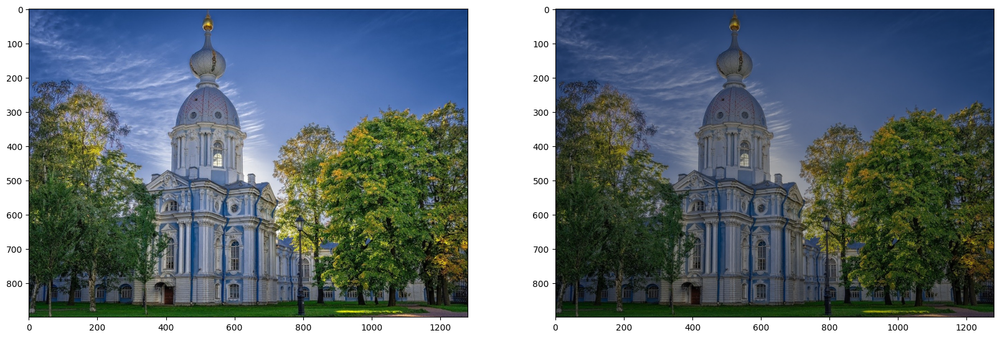

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(img_original)
axes[1].imshow(img_result)

Изображение в этом конкретном случае хоть и стало стетлее, но с цветом тут явно что-то не то. Дело заключается в способе хранения самого изображения. Из-за того, что для хранения значения интенсивности отведено $8$ бит, при превышении значения в $255$ происходит циклический сдвиг (берется остаток по $\mod 256)$. Например, пиксель
<code>img_result[50][50]</code> имеет следующие значения интенсивностей (после округления):

$$
[200, 232, 268],
$$
но из-за циклического сдвига результат другой ($268 \mod 256 = 12$):

In [12]:
img_result[50][50]

array([ 39,  61, 103], dtype=uint8)

Логичным кажется следующее решение. Нецелые значения будем округлять, а значения, превосходящие 255, будем считать равными 255. Проверим, что это нам даст.

In [13]:
def exposure(image, p):
    img_result = np.round(image.copy() * (2 ** p),0)
    img_result = img_result.astype(int)
    for i in range(img_result.shape[0]):
      for j in range(img_result.shape[1]):
        for k in range(img_result.shape[2]):
          if img_result[i][j][k] > 255:
            img_result[i][j][k] = 255
    return img_result


img_result = exposure(img_original, -0.53)


In [14]:
img_result[50][50]

array([ 39,  61, 103])

Построим изображение

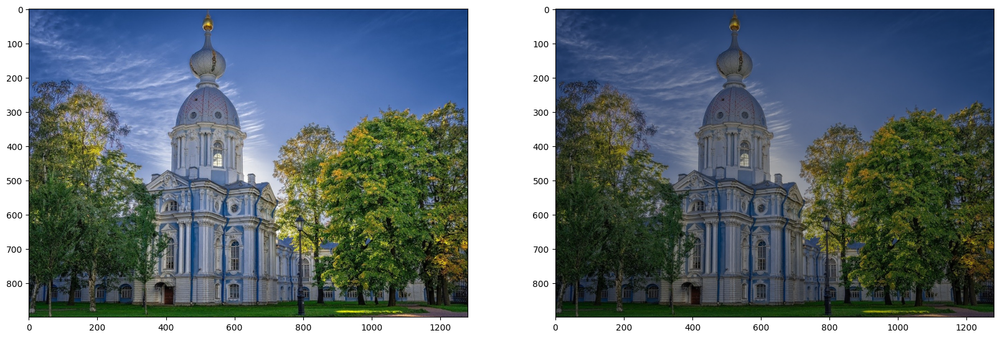

In [15]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(img_original)
axes[1].imshow(img_result)

Cравним средние значения интенсивности пикселя для исходного и модифицированного изображений:

In [16]:
print("Среднее значение интенсивности пикселя исходного изображения:", np.mean(img_original))
print("Среднее значение интенсивности пикселя модифицированного изображения:", np.mean(img_result))

Среднее значение интенсивности пикселя исходного изображения: 97.90389524239896
Среднее значение интенсивности пикселя модифицированного изображения: 67.7932650862069


Для большей наглядности сравним гистограммы исходного и измененного изображений:

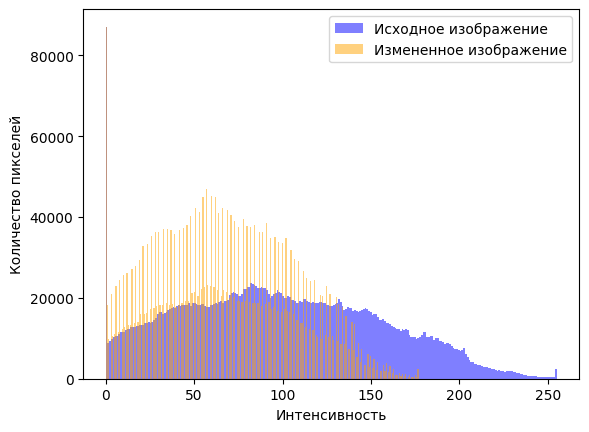

In [17]:
plt.hist(img_original.ravel(), bins = 256, color = 'Blue', alpha = 0.5)
plt.hist(img_result.ravel(), bins = 256, color = 'Orange', alpha = 0.5)
plt.legend(['Исходное изображение', 'Измененное изображение'])
plt.xlabel('Интенсивность')
plt.ylabel('Количество пикселей')
plt.show()

Измененное изображение сместилось вправо (в более светлую область), чего и следовало ожидать. При этом достаточно большое количество пикселей имеет значение, равное 255.

Самостоятельно предлагается посмотреть понижение яркости, где соответсвующая гистограмма сместится влево.

# Изменение экспозиции при помощи библиотеки

Попробуем повторить произведенные преобразования средствами библиотеки CV2. Для этого нам потребуется сохранить изображение в файл, а затем произвести чтение из файла. При этом файл должен быть сжат алгоритмом без потери качества (например, подойдет .png; при использовании, например, .jpeg, результат будет немного другим).

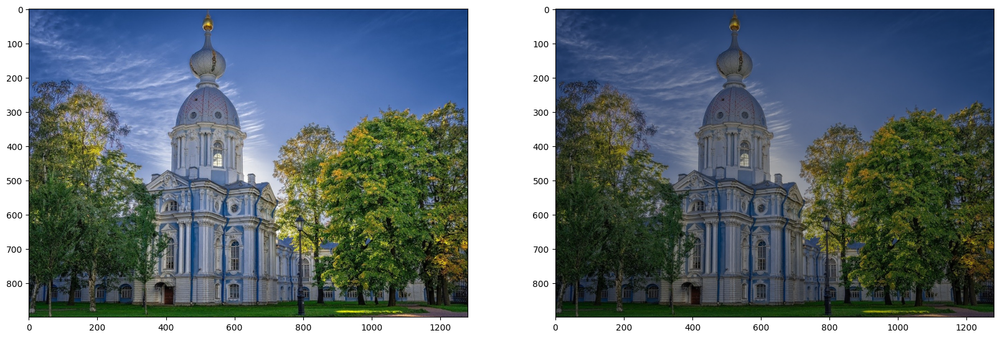

In [21]:
def exposure(image, p):
    return image.copy() * (2 ** p)

#Преобразование
img_result_lib = exposure(img_original, -0.53)
#Сохранение в файл
cv2.imwrite("img_result_lib.png", img_result_lib)
#Чтение из файла
img_result_lib = cv2.imread("img_result_lib.png")


fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(img_original)
axes[1].imshow(img_result_lib)

In [22]:
print("Среднее значение интенсивности пикселя изображения, измененного вручную:", np.mean(img_result))
print("Среднее значение интенсивности пикселя изображения, измененного библиотекой:", np.mean(img_result_lib))

Среднее значение интенсивности пикселя изображения, измененного вручную: 67.7932650862069
Среднее значение интенсивности пикселя изображения, измененного библиотекой: 67.7932650862069


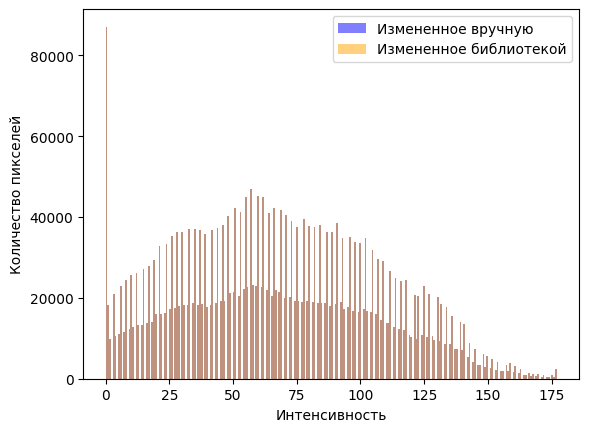

In [23]:
plt.hist(img_result_lib.ravel(), bins = 256, color = 'Blue', alpha = 0.5)
plt.hist(img_result.ravel(), bins = 256, color = 'Orange', alpha = 0.5)
plt.legend(['Измененное вручную', 'Измененное библиотекой'])
plt.xlabel('Интенсивность')
plt.ylabel('Количество пикселей')
plt.show()

In [24]:
flag = True
for i in range(img_result.shape[0]):
      for j in range(img_result.shape[1]):
        for k in range(img_result.shape[2]):
          if (img_result[i][j][k] != img_result_lib[i][j][k]):
            flag = False
if flag == True:
  print('Результаты полностью совпали!')
else:
  print('Результаты не совпали!')

Результаты полностью совпали!


# Контрастность

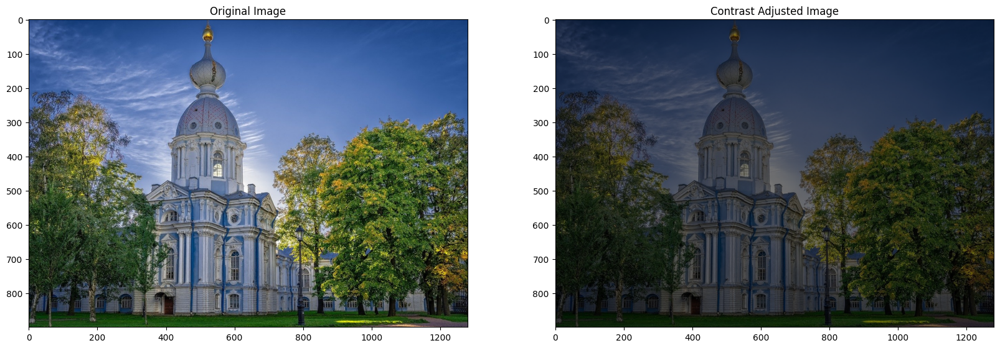

In [32]:
# Функция для изменения контрастности
def adjust_contrast(image, alpha):
    return cv2.convertScaleAbs(image, alpha=alpha, beta=0)

# Чтение оригинального изображения
img_original = cv2.imread('1.jpeg')
img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)  # Преобразование в RGB для правильного отображения в matplotlib

# Преобразование контрастности
alpha = 1 - 0.53  # Коэффициент изменения контрастности, >1 для увеличения, <1 для уменьшения
img_contrast = adjust_contrast(img_original, alpha)

# Сохранение в файл
cv2.imwrite("img_contrast.png", cv2.cvtColor(img_contrast, cv2.COLOR_RGB2BGR))

# Чтение из файла
img_contrast = cv2.imread("img_contrast.png")
img_contrast = cv2.cvtColor(img_contrast, cv2.COLOR_BGR2RGB)

# Отображение изображений
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(img_original)
axes[0].set_title("Original Image")
axes[1].imshow(img_contrast)
axes[1].set_title("Contrast Adjusted Image")

plt.show()

In [35]:
print("Среднее значение интенсивности пикселя изображения, измененного вручную:", np.mean(img_contrast))

Среднее значение интенсивности пикселя изображения, измененного вручную: 136.24358546533185


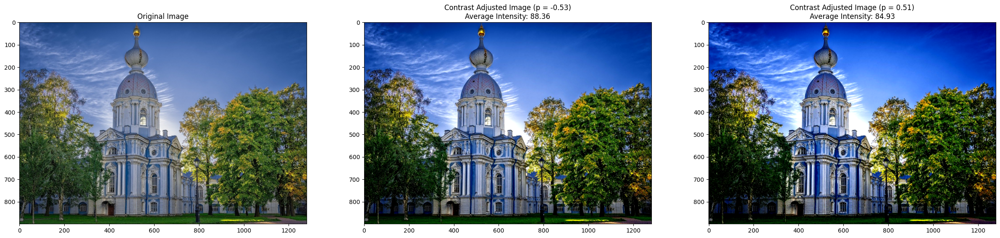

In [42]:

# Функция для изменения контрастности
def adjust_contrast(image, p):
    # Преобразуем значения пикселей в диапазон [0, 1]
    image = image / 255.0
    if p > 0:
        image = (image - 0.5) * (1 / (1 - p)) + 0.5
    else:
        image = (image - 0.5) * (1 - p) + 0.5
    # Ограничиваем значения в диапазоне [0, 1]
    image = np.clip(image, 0, 1)
    # Возвращаем значения в диапазон [0, 255]
    image = (image * 255).astype(np.uint8)
    return image

# Чтение оригинального изображения
img_original = cv2.imread('1.jpeg')
img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)  # Преобразование в RGB для правильного отображения в matplotlib

# Преобразование контрастности
p_values = [-0.53, 0.51]
results = []

for p in p_values:
    img_contrast = adjust_contrast(img_original, p)
    results.append(img_contrast)
    cv2.imwrite(f"img_contrast_{p}.png", cv2.cvtColor(img_contrast, cv2.COLOR_RGB2BGR))

# Вычисление среднего значения интенсивности пикселя
avg_intensities = [np.mean(result) for result in results]

# Отображение изображений
fig, axes = plt.subplots(1, 3, figsize=(30, 10))
axes[0].imshow(img_original)
axes[0].set_title("Original Image")

for i, p in enumerate(p_values):
    axes[i + 1].imshow(results[i])
    axes[i + 1].set_title(f"Contrast Adjusted Image (p = {p})\nAverage Intensity: {avg_intensities[i]:.2f}")

plt.show()


In [43]:
for p in (results):
    print("Среднее значение интенсивности пикселя изображения, измененного вручную:", np.mean(p))

Среднее значение интенсивности пикселя изображения, измененного вручную: 88.35717753522432
Среднее значение интенсивности пикселя изображения, измененного вручную: 84.92934771273637
